In [62]:
# Library
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from tqdm.auto import tqdm
import statsmodels
import statsmodels.api as sm

import lightgbm as lgb
from sklearn.model_selection import train_test_split
#from sklearn.metrics import mean_pinball_loss
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error # モデル評価用(平均二乗誤差)
from sklearn.metrics import r2_score # モデル評価用(決定係数)
import warnings
warnings.simplefilter('ignore')

# 分布確認
#import pandas_profiling as pdp

# 前処理
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder

# バリデーション
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold

# 評価指標
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

# plot style
pd.set_option('display.max_columns', 200)
plt.rcParams['axes.facecolor'] = 'EEFFFE'

import pandas_profiling as pdp


In [63]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [64]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   gameId               8000 non-null   int64
 1   blueFirstBlood       8000 non-null   int64
 2   blueKills            8000 non-null   int64
 3   blueDeaths           8000 non-null   int64
 4   blueAssists          8000 non-null   int64
 5   blueEliteMonsters    8000 non-null   int64
 6   blueDragons          8000 non-null   int64
 7   blueTotalGold        8000 non-null   int64
 8   blueTotalExperience  8000 non-null   int64
 9   blueWins             8000 non-null   int64
dtypes: int64(10)
memory usage: 625.1 KB


In [65]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   gameId               2000 non-null   int64
 1   blueFirstBlood       2000 non-null   int64
 2   blueKills            2000 non-null   int64
 3   blueDeaths           2000 non-null   int64
 4   blueAssists          2000 non-null   int64
 5   blueEliteMonsters    2000 non-null   int64
 6   blueDragons          2000 non-null   int64
 7   blueTotalGold        2000 non-null   int64
 8   blueTotalExperience  2000 non-null   int64
dtypes: int64(9)
memory usage: 140.8 KB


In [66]:
train["blueTotalExperience + blueTotalGold"] = train["blueTotalExperience"] + train["blueTotalGold"]
train["blueTotalExperience * blueTotalGold"] = train["blueTotalExperience"] * train["blueTotalGold"]

train["blueKills - blueDeaths"] = train["blueKills"]-train["blueDeaths"]
train["blueKills / blueDeaths"] = (train["blueKills"])/(train["blueDeaths"]+1)
train["blueKills+blueAssists / blueDeaths"] = (train["blueKills"]+train["blueAssists"])/(train["blueDeaths"]+1)


train["blueAssists - blueDeaths"] = train["blueAssists"]-train["blueDeaths"]
train["17000<blueTotalGold<18000"]=((train["blueTotalGold"]>17000)&(train["blueTotalGold"]<18000)).astype(int)
train["blueTotalGold>18000"]=((train["blueTotalGold"]>18000)).astype(int)
train["blueTotalExperience<17500 & blueTotalGold<17000"] = ((train["blueTotalExperience"]<17500)&(train["blueTotalGold"]<17000)).astype(int)
train["blueTotalExperience + blueTotalGold >36000"] = ((train["blueTotalExperience"] + train["blueTotalGold"]) > 36000).astype(int)

#train.loc[16000<train["blueTotalGold"]<17000,"16000<blueTotalGold<17000"] = 

array([[<AxesSubplot: title={'center': 'gameId'}>,
        <AxesSubplot: title={'center': 'blueFirstBlood'}>,
        <AxesSubplot: title={'center': 'blueKills'}>,
        <AxesSubplot: title={'center': 'blueDeaths'}>],
       [<AxesSubplot: title={'center': 'blueAssists'}>,
        <AxesSubplot: title={'center': 'blueEliteMonsters'}>,
        <AxesSubplot: title={'center': 'blueDragons'}>,
        <AxesSubplot: title={'center': 'blueTotalGold'}>],
       [<AxesSubplot: title={'center': 'blueTotalExperience'}>,
        <AxesSubplot: title={'center': 'blueWins'}>,
        <AxesSubplot: title={'center': 'blueTotalExperience + blueTotalGold'}>,
        <AxesSubplot: title={'center': 'blueTotalExperience * blueTotalGold'}>],
       [<AxesSubplot: title={'center': 'blueKills - blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueKills / blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueKills+blueAssists / blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueAssists - bl

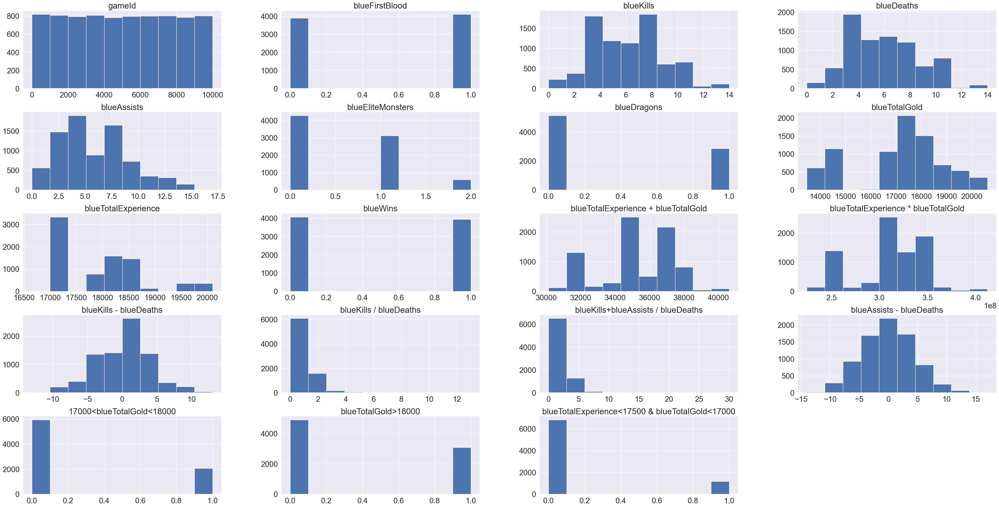

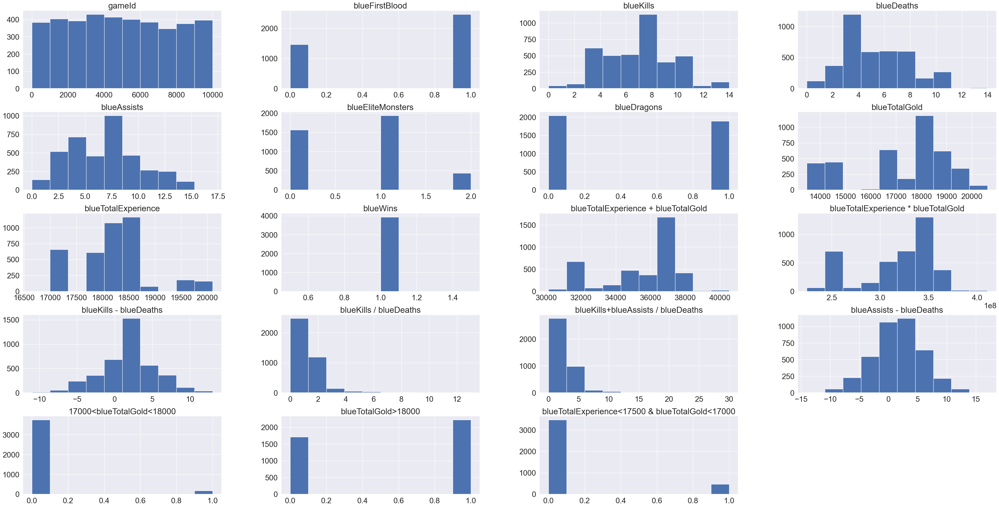

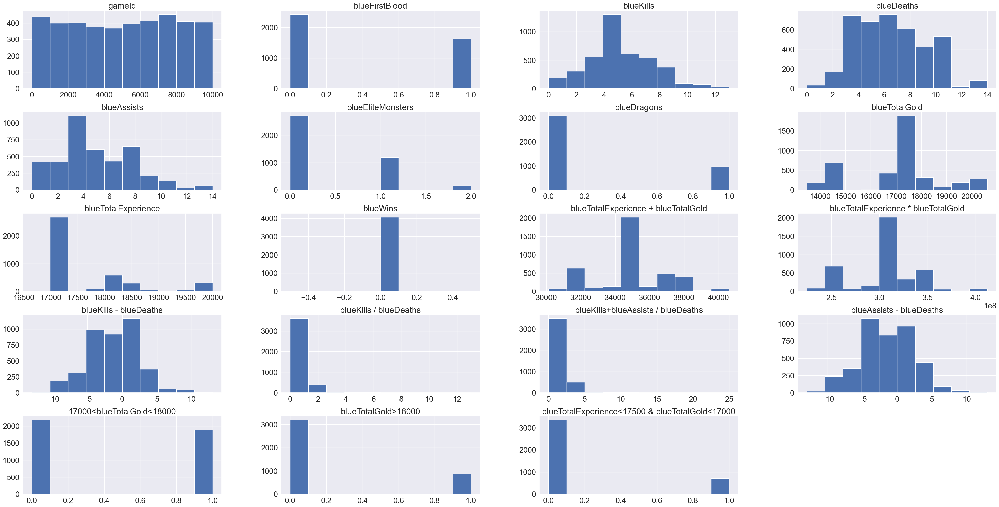

In [67]:
sns.set(rc = {'figure.figsize':(50,25)})
sns.set(font_scale = 2)


train_win = train[train["blueWins"]==1]
train_lose = train[train["blueWins"]==0]
train.hist()
train_win.hist()
train_lose.hist()

array([[<AxesSubplot: title={'center': 'gameId'}>,
        <AxesSubplot: title={'center': 'blueFirstBlood'}>,
        <AxesSubplot: title={'center': 'blueKills'}>,
        <AxesSubplot: title={'center': 'blueDeaths'}>],
       [<AxesSubplot: title={'center': 'blueAssists'}>,
        <AxesSubplot: title={'center': 'blueEliteMonsters'}>,
        <AxesSubplot: title={'center': 'blueDragons'}>,
        <AxesSubplot: title={'center': 'blueTotalGold'}>],
       [<AxesSubplot: title={'center': 'blueTotalExperience'}>,
        <AxesSubplot: title={'center': 'blueWins'}>,
        <AxesSubplot: title={'center': 'blueTotalExperience + blueTotalGold'}>,
        <AxesSubplot: title={'center': 'blueTotalExperience * blueTotalGold'}>],
       [<AxesSubplot: title={'center': 'blueKills - blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueKills / blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueKills+blueAssists / blueDeaths'}>,
        <AxesSubplot: title={'center': 'blueAssists - bl

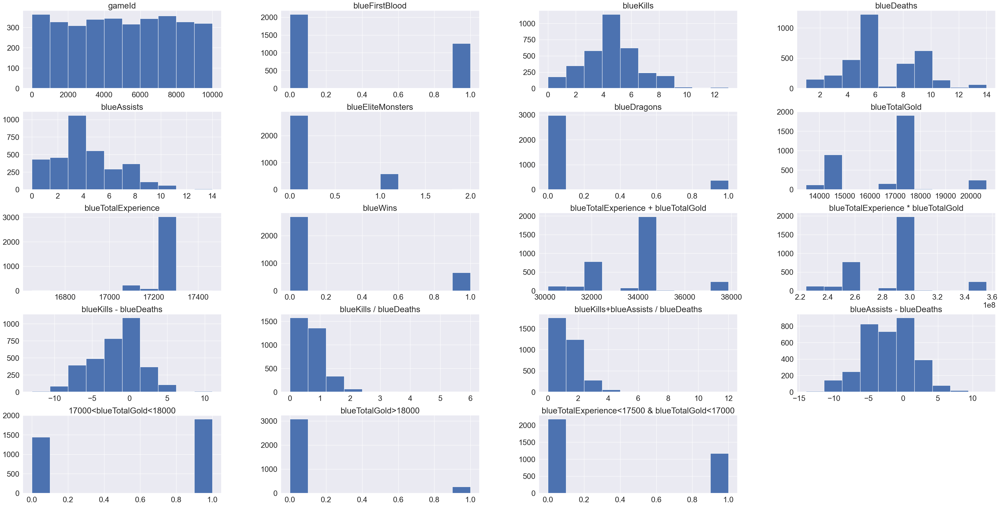

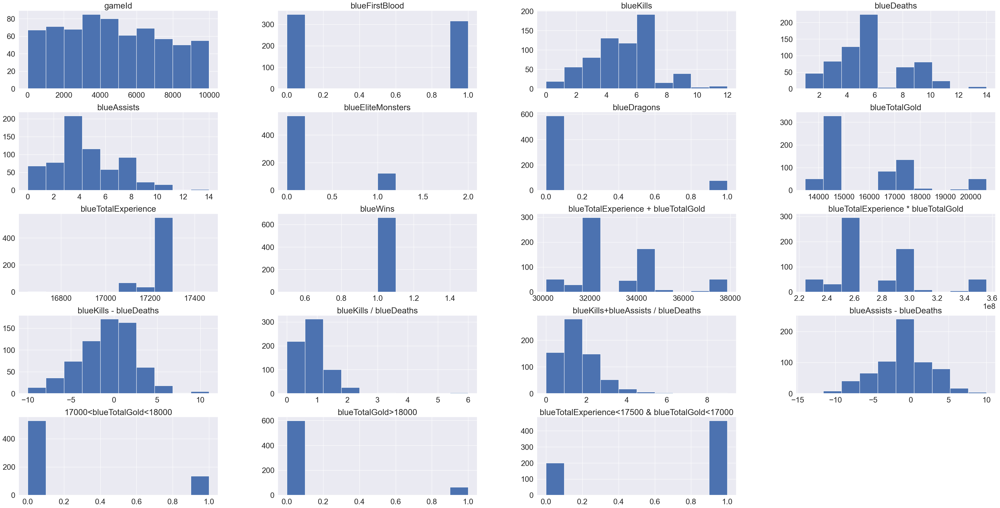

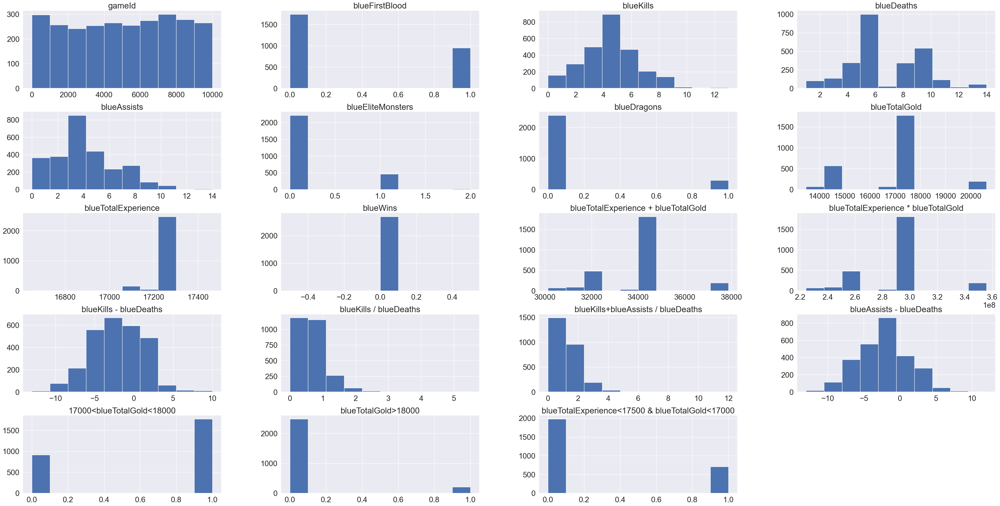

In [68]:
train[train["blueTotalExperience"]<17500].hist()
train_win[train_win["blueTotalExperience"]<17500].hist()
train_lose[train_lose["blueTotalExperience"]<17500].hist()

<AxesSubplot: >

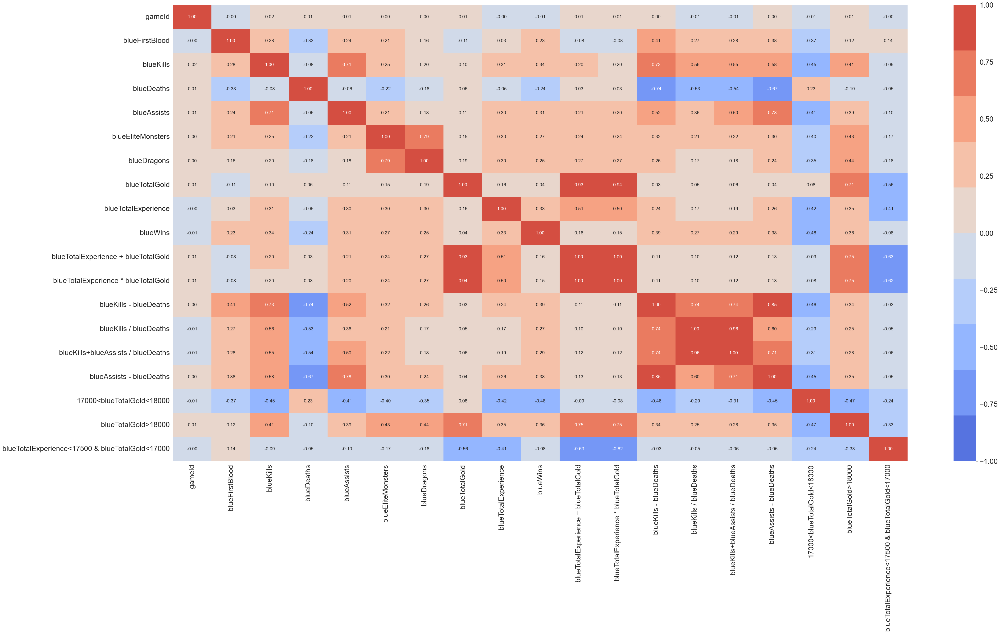

In [69]:
corr = train.corr()
sns.set(rc = {'figure.figsize':(50,25)})
sns.set(font_scale = 2)
sns.heatmap(corr, cmap= sns.color_palette('coolwarm', 10), annot=True,fmt='.2f', vmin = -1, vmax = 1,annot_kws={"fontsize":14})

In [70]:
pdp.ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

gameId


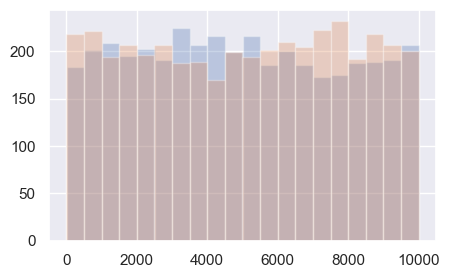

blueFirstBlood


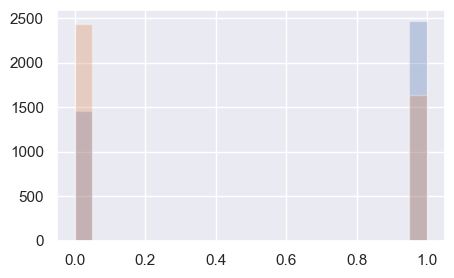

blueKills


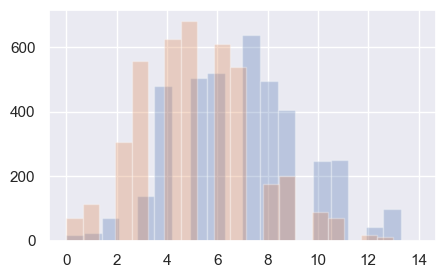

blueDeaths


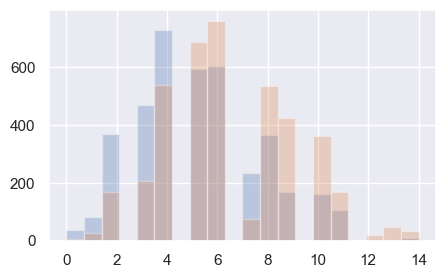

blueAssists


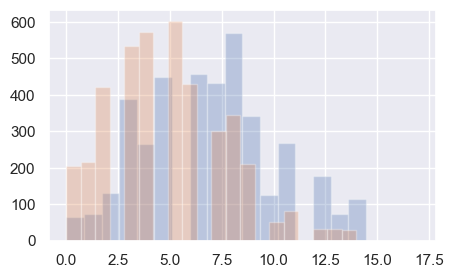

blueEliteMonsters


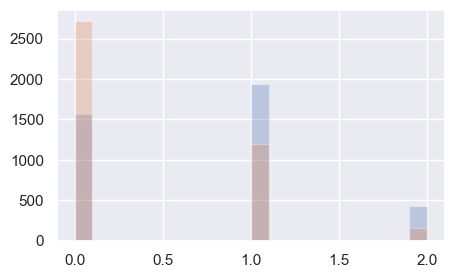

blueDragons


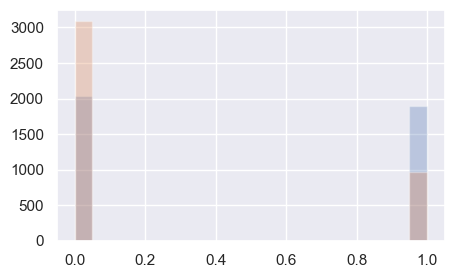

blueTotalGold


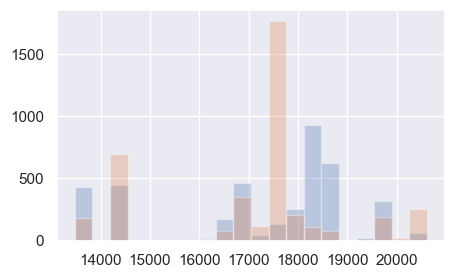

blueTotalExperience


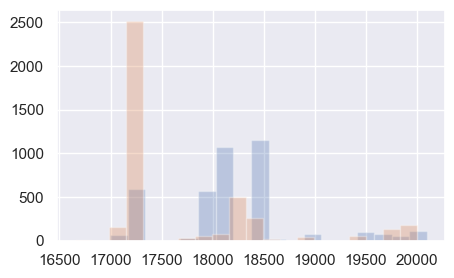

blueWins


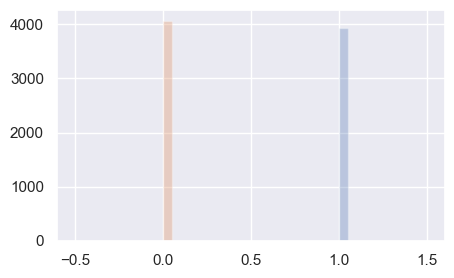

blueTotalExperience + blueTotalGold


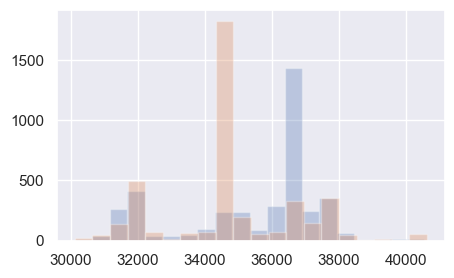

blueTotalExperience * blueTotalGold


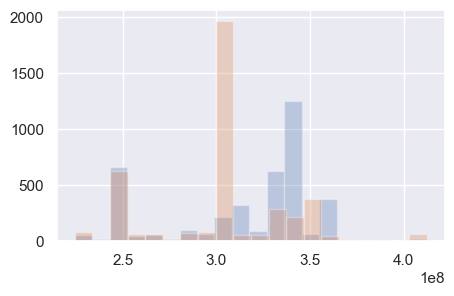

blueKills - blueDeaths


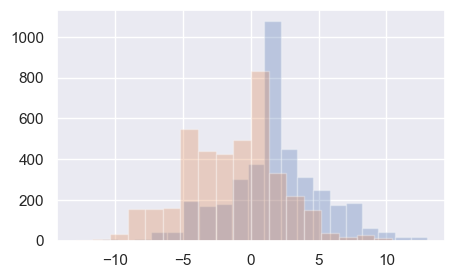

blueKills / blueDeaths


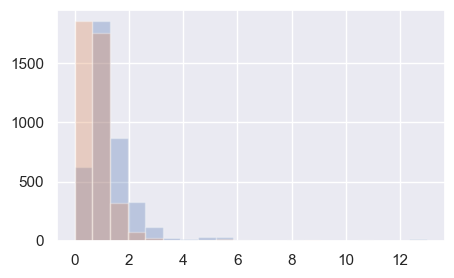

blueKills+blueAssists / blueDeaths


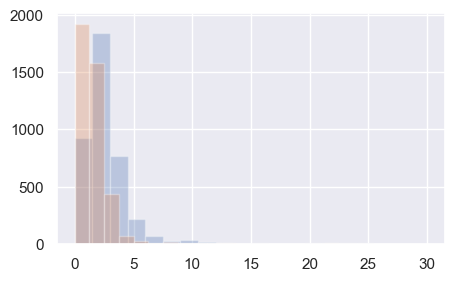

blueAssists - blueDeaths


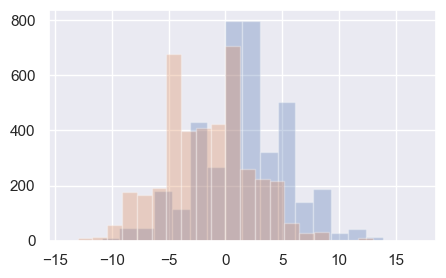

17000<blueTotalGold<18000


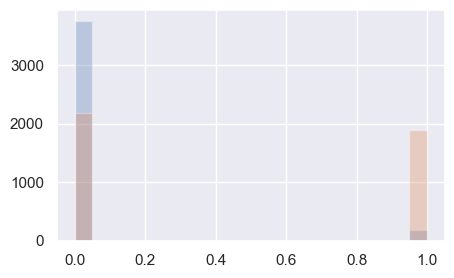

blueTotalGold>18000


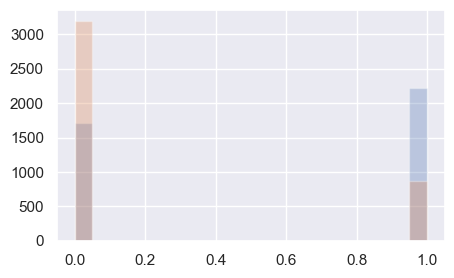

blueTotalExperience<17500 & blueTotalGold<17000


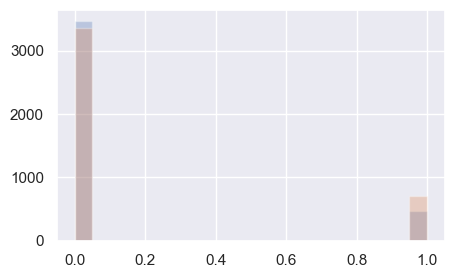

In [89]:
sns.set(rc = {'figure.figsize':(5,3)})
for col in train.columns:
    #train[col].hist(alpha=0.3,bins=10,label='all')
    train_win[col].hist(alpha=0.3,bins=20,label='win')
    train_lose[col].hist(alpha=0.3,bins=20,label='lose')
    print(col)
    plt.show()

In [75]:
train.columns

Index(['gameId', 'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueTotalGold',
       'blueTotalExperience', 'blueWins',
       'blueTotalExperience + blueTotalGold',
       'blueTotalExperience * blueTotalGold', 'blueKills - blueDeaths',
       'blueKills / blueDeaths', 'blueKills+blueAssists / blueDeaths',
       'blueAssists - blueDeaths', '17000<blueTotalGold<18000',
       'blueTotalGold>18000',
       'blueTotalExperience<17500 & blueTotalGold<17000'],
      dtype='object')